# Genetic Algorithm

### Using Genetic Algorithm to solve N-Queen problem

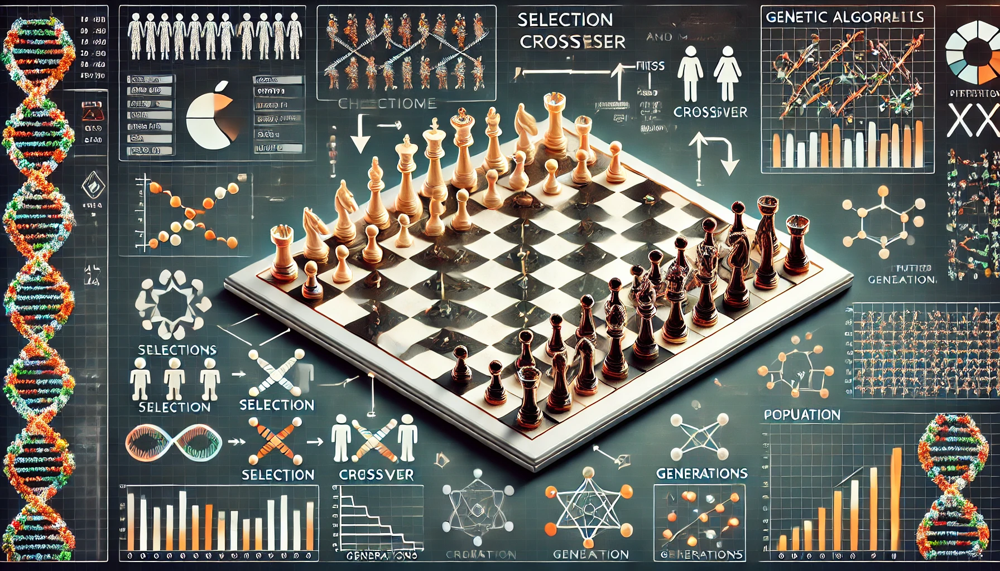

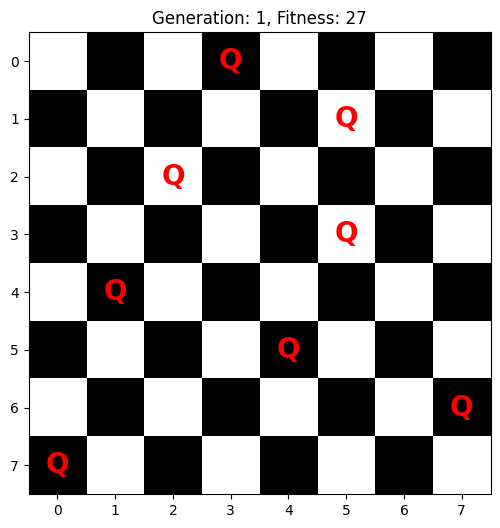

In [1]:
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Parameters for the genetic algorithm
N = 8  # Size of the board (8x8 for the 8-queens problem)
population_size = 100  # Number of individuals in the population
generations = 50  # Number of generations to simulate
mutation_rate = 0.05  # Probability of mutation for an individual

# Helper functions
def create_board(individual):
    """Create a board from an individual (a solution to the N-queens problem)
    
    Args:
        individual (array-like): An array representing the positions of queens.
        
    Returns:
        np.ndarray: A 2D array representing the board with queens placed.
    """
    board = np.zeros((N, N), dtype=int)  # Initialize an empty NxN board
    for row, col in enumerate(individual):  # Place queens based on the individual's representation
        board[row, col] = 1
    return board

def fitness(individual):
    """Calculate the fitness of an individual
    
    Fitness is defined as the number of non-attacking pairs of queens.
    
    Args:
        individual (array-like): An array representing the positions of queens.
        
    Returns:
        int: The fitness score (higher is better).
    """
    non_attacking_pairs = 0
    for i in range(N):
        for j in range(i + 1, N):
            if individual[i] != individual[j] and abs(individual[i] - individual[j]) != j - i:
                non_attacking_pairs += 1
    return non_attacking_pairs

def selection(population, fitnesses):
    """Select parents based on fitness
    
    Args:
        population (list): The current population of individuals.
        fitnesses (list): The fitness scores corresponding to the population.
        
    Returns:
        tuple: Two selected parents for crossover.
    """
    total_fitness = sum(fitnesses)
    probabilities = [f / total_fitness for f in fitnesses]  # Calculate selection probabilities
    parents = np.random.choice(range(len(population)), size=2, p=probabilities)  # Select two parents
    return population[parents[0]], population[parents[1]]

def crossover(parent1, parent2):
    """Perform crossover between two parents to produce offspring
    
    Args:
        parent1 (array-like): The first parent individual.
        parent2 (array-like): The second parent individual.
        
    Returns:
        tuple: Two offspring produced by crossover.
    """
    point = random.randint(1, N - 1)  # Select a crossover point
    child1 = np.concatenate([parent1[:point], parent2[point:]])  # Create first child
    child2 = np.concatenate([parent2[:point], parent1[point:]])  # Create second child
    return child1, child2

def mutate(individual):
    """Mutate an individual with a certain probability
    
    Args:
        individual (array-like): The individual to potentially mutate.
        
    Returns:
        array-like: The mutated individual.
    """
    if random.random() < mutation_rate:  # Apply mutation with a certain probability
        idx = random.randint(0, N - 1)  # Select a random position
        individual[idx] = random.randint(0, N - 1)  # Change the value at that position
    return individual

# Initialize the population with random permutations of queens
population = [np.random.permutation(N) for _ in range(population_size)]
best_solution = None  # Track the best solution found
best_fitness = 0  # Track the best fitness score
fitness_history = []  # History of fitness scores for each generation

# Setup figure and axis for animation
fig, ax = plt.subplots(figsize=(6, 6))

def draw_chessboard(ax, board):
    """Draw a chessboard with queens
    
    Args:
        ax (matplotlib.axes.Axes): The axis to draw on.
        board (np.ndarray): The board with queens placed.
    """
    chessboard = np.zeros((N, N, 3), dtype=int)  # Initialize an empty chessboard
    for i in range(N):
        for j in range(N):
            if (i + j) % 2 == 0:
                chessboard[i, j] = [255, 255, 255]  # White squares
            else:
                chessboard[i, j] = [0, 0, 0]  # Black squares

    ax.imshow(chessboard)  # Display the chessboard
    for row in range(N):
        for col in range(N):
            if board[row, col] == 1:
                ax.text(col, row, 'Q', ha='center', va='center', color='red', fontsize=20, fontweight='bold')  # Draw queens

def update(frame):
    """Update the population and the plot for each frame of the animation
    
    Args:
        frame (int): The current generation/frame number.
    """
    global population, best_solution, best_fitness, fitness_history
    
    # Calculate fitness for the current population
    fitnesses = [fitness(ind) for ind in population]
    new_population = []

    # Create new population through selection, crossover, and mutation
    for _ in range(population_size // 2):
        parent1, parent2 = selection(population, fitnesses)  # Select parents
        child1, child2 = crossover(parent1, parent2)  # Perform crossover
        new_population.append(mutate(child1))  # Mutate and add first child
        new_population.append(mutate(child2))  # Mutate and add second child

    population = new_population
    fitnesses = [fitness(ind) for ind in population]  # Calculate fitness for the new population
    best_individual = population[np.argmax(fitnesses)]  # Find the best individual in the new population
    best_individual_fitness = max(fitnesses)  # Find the best fitness score in the new population

    if best_individual_fitness > best_fitness:  # Update best solution if the new one is better
        best_fitness = best_individual_fitness
        best_solution = best_individual

    fitness_history.append(best_fitness)  # Record the best fitness score

    ax.clear()  # Clear the axis
    draw_chessboard(ax, create_board(best_solution))  # Draw the new best solution
    ax.set_title(f"Generation: {frame + 1}, Fitness: {best_fitness}")  # Update the title with the generation and fitness

# Create animation
anim = animation.FuncAnimation(fig, update, frames=generations, repeat=False)

# Display the animation in the notebook
HTML(anim.to_jshtml())


Certainly! Here is a brief explanation of how the provided code works:

### Overview
This code implements a genetic algorithm to solve the N-queens problem, specifically for an 8x8 chessboard. The goal is to place 8 queens on the board such that no two queens attack each other.

### Components

1. **Parameters:**
   - `N`: Size of the board (8 for the 8-queens problem).
   - `population_size`: Number of individuals (solutions) in the population.
   - `generations`: Number of generations to simulate.
   - `mutation_rate`: Probability of mutating an individual.

2. **Helper Functions:**
   - `create_board(individual)`: Converts an individual (array representing queen positions) into a board representation.
   - `fitness(individual)`: Calculates the fitness score of an individual by counting non-attacking queen pairs.
   - `selection(population, fitnesses)`: Selects two parents from the population based on their fitness scores.
   - `crossover(parent1, parent2)`: Performs crossover between two parents to produce two offspring.
   - `mutate(individual)`: Applies mutation to an individual with a certain probability.

3. **Initialization:**
   - A population of random permutations of queen positions is created.
   - Variables to track the best solution and fitness are initialized.

4. **Animation Setup:**
   - A figure and axis for the animation are set up using Matplotlib.
   - A function `draw_chessboard(ax, board)` is defined to draw the chessboard and queens on it.

5. **Genetic Algorithm Loop:**
   - The `update(frame)` function is called for each generation (frame of the animation).
   - For each generation:
     - Fitness scores are calculated for the population.
     - A new population is created through selection, crossover, and mutation.
     - The best solution and fitness score are updated if a better solution is found.
     - The current best solution is displayed on the chessboard.

6. **Animation:**
   - The `FuncAnimation` function from Matplotlib is used to animate the evolution of the population over the specified number of generations.
   - The animation is displayed in the notebook using `HTML(anim.to_jshtml())`.

### How It Works
1. **Initialization:** The algorithm starts by generating a random initial population of potential solutions (individuals), where each individual is a permutation of queen positions on the board.

2. **Fitness Calculation:** Each individual’s fitness is calculated based on the number of non-attacking queen pairs. The higher the fitness, the fewer queens are attacking each other.

3. **Selection:** Two parents are selected from the population based on their fitness scores. Individuals with higher fitness are more likely to be selected.

4. **Crossover:** The selected parents undergo crossover, producing two offspring by combining parts of each parent's solution.

5. **Mutation:** Each offspring may undergo mutation with a certain probability, changing the position of one queen randomly to introduce diversity.

6. **New Generation:** The new population, consisting of the offspring, replaces the old population. This process repeats for the specified number of generations.

7. **Visualization:** The algorithm's progress is visualized using an animated chessboard, showing the best solution found in each generation.

By the end of the simulation, the algorithm aims to find a solution where all queens are placed such that no two queens attack each other.

# Particle Swarm Optimization Algorithm

### Using PSO algorith to solve SUDOKO puzzle

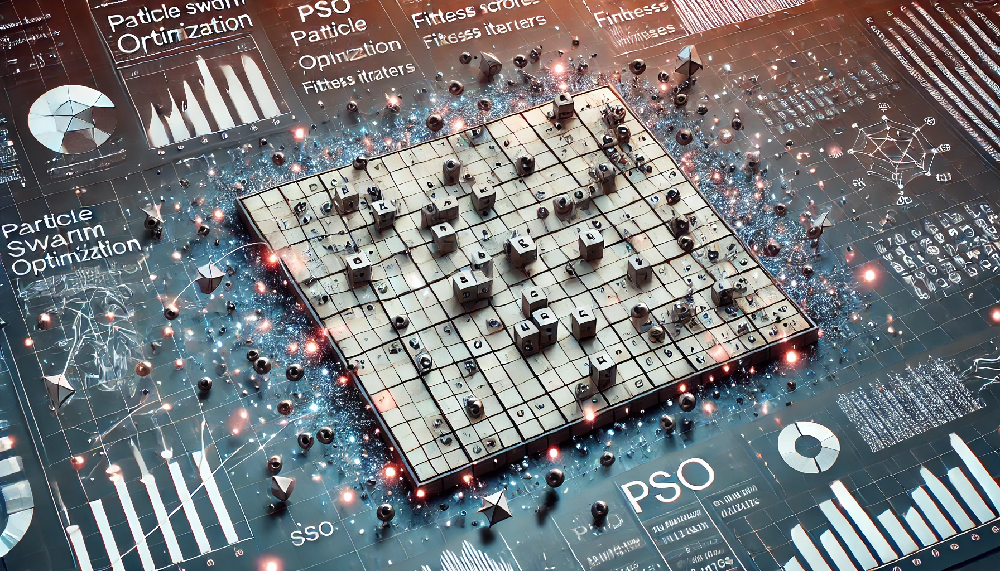

Solution found in 999 iterations:
[[5 3 9 2 7 2 7 9 9]
 [6 4 1 1 9 5 8 3 1]
 [7 9 8 1 9 6 4 6 2]
 [8 5 7 9 6 4 5 2 3]
 [4 9 6 8 8 3 9 5 1]
 [7 2 3 1 2 5 8 4 6]
 [3 6 4 5 9 7 2 8 4]
 [7 2 8 4 1 9 6 3 5]
 [5 1 9 6 8 8 1 7 9]]


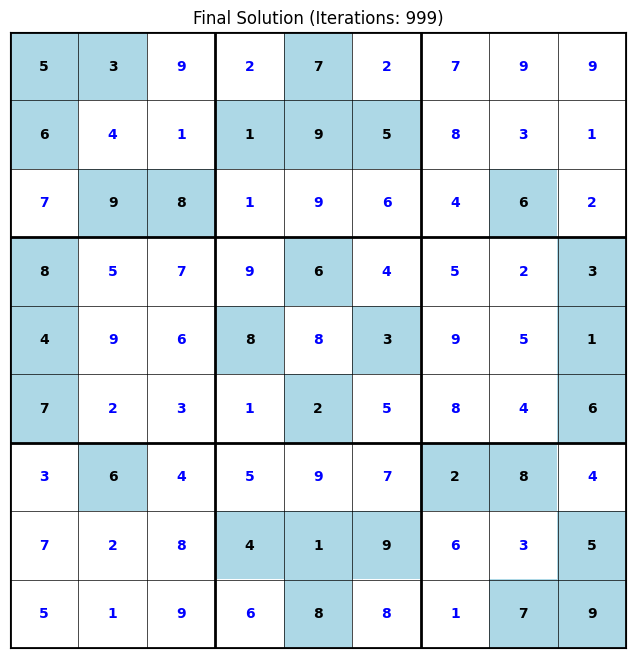

In [3]:
import random
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from IPython.display import display, clear_output
import time

# Define a class for particles used in the PSO algorithm
class Particle:
    def __init__(self, puzzle):
        self.puzzle = puzzle.copy()  # The current state of the puzzle
        self.best_puzzle = puzzle.copy()  # The best state found by this particle
        self.best_fitness = float('inf')  # The best fitness score of this particle
        self.velocity = np.zeros((9, 9), dtype=float)  # The velocity for updating the puzzle state

    def update_best(self, fitness):
        """Update the best known position of the particle if the current fitness is better"""
        if fitness < self.best_fitness:
            self.best_fitness = fitness
            self.best_puzzle = self.puzzle.copy()

# Initialize a Sudoku puzzle by filling empty cells with random numbers
def initialize_puzzle(initial_puzzle):
    puzzle = initial_puzzle.copy()
    for i in range(9):
        for j in range(9):
            if puzzle[i][j] == 0:
                puzzle[i][j] = random.randint(1, 9)
    return puzzle

# Calculate the fitness of a Sudoku puzzle
def calculate_fitness(puzzle):
    fitness = 0
    for i in range(9):
        fitness += 9 - len(set(puzzle[i]))  # Row fitness
        fitness += 9 - len(set(puzzle[:, i]))  # Column fitness
    for i in range(0, 9, 3):
        for j in range(0, 9, 3):
            fitness += 9 - len(set(puzzle[i:i+3, j:j+3].flatten()))  # Block fitness
    return fitness

# Plot the Sudoku puzzle using Matplotlib
def plot_sudoku(puzzle, ax, initial_puzzle):
    cmap = ListedColormap(['white', 'lightblue'])  # Define colors for initial and filled cells
    ax.imshow(initial_puzzle != 0, cmap=cmap)  # Plot initial puzzle cells
    for i in range(10):
        ax.axhline(y=i-0.5, color='black', linewidth=2 if i % 3 == 0 else 0.5)  # Horizontal lines
        ax.axvline(x=i-0.5, color='black', linewidth=2 if i % 3 == 0 else 0.5)  # Vertical lines
    for i in range(9):
        for j in range(9):
            color = 'black' if initial_puzzle[i, j] != 0 else 'blue'  # Different color for initial and filled cells
            ax.text(j, i, str(puzzle[i, j]), ha='center', va='center', color=color, fontweight='bold')  # Cell values
    ax.set_xticks([])
    ax.set_yticks([])

# Particle Swarm Optimization (PSO) algorithm for solving Sudoku
def pso_sudoku(initial_puzzle, num_particles=50, max_iterations=1000):
    # Initialize particles with random Sudoku puzzles
    particles = [Particle(initialize_puzzle(initial_puzzle)) for _ in range(num_particles)]
    global_best = min(particles, key=lambda p: calculate_fitness(p.puzzle))  # Find the initial global best particle
    global_best_fitness = calculate_fitness(global_best.puzzle)  # Calculate the fitness of the global best particle

    fig, ax = plt.subplots(figsize=(8, 8))
    plt.ion()  # Enable interactive mode for live updates

    for iteration in range(max_iterations):
        for particle in particles:
            fitness = calculate_fitness(particle.puzzle)
            particle.update_best(fitness)  # Update particle's best known position

            if fitness < global_best_fitness:  # Update global best if current particle is better
                global_best = particle
                global_best_fitness = fitness

        if global_best_fitness == 0:  # If a solution is found, exit the loop
            break

        # Update each particle's position and velocity
        for particle in particles:
            w = 0.5 + random.random() / 2  # Inertia weight
            c1 = 1  # Cognitive (particle's own best) coefficient
            c2 = 2  # Social (global best) coefficient
            r1, r2 = random.random(), random.random()  # Random coefficients

            # Update velocity
            particle.velocity = (w * particle.velocity +
                                 c1 * r1 * (particle.best_puzzle - particle.puzzle) +
                                 c2 * r2 * (global_best.puzzle - particle.puzzle))

            # Update position
            particle.puzzle = particle.puzzle + np.round(particle.velocity).astype(int)
            particle.puzzle = np.clip(particle.puzzle, 1, 9)  # Ensure values are between 1 and 9

            # Restore initial puzzle cells
            mask = initial_puzzle != 0
            particle.puzzle[mask] = initial_puzzle[mask]

        # Plot the current best solution every 10 iterations
        if iteration % 10 == 0 or iteration == max_iterations - 1:
            ax.clear()
            plot_sudoku(global_best.puzzle, ax, initial_puzzle)
            ax.set_title(f'Iteration: {iteration}, Fitness: {global_best_fitness}')
            display(fig)
            clear_output(wait=True)
            time.sleep(0.1)

    plt.ioff()  # Disable interactive mode
    plt.close(fig)
    return global_best.puzzle, iteration

# Example usage
initial_puzzle = np.array([
    [5, 3, 0, 0, 7, 0, 0, 0, 0],
    [6, 0, 0, 1, 9, 5, 0, 0, 0],
    [0, 9, 8, 0, 0, 0, 0, 6, 0],
    [8, 0, 0, 0, 6, 0, 0, 0, 3],
    [4, 0, 0, 8, 0, 3, 0, 0, 1],
    [7, 0, 0, 0, 2, 0, 0, 0, 6],
    [0, 6, 0, 0, 0, 0, 2, 8, 0],
    [0, 0, 0, 4, 1, 9, 0, 0, 5],
    [0, 0, 0, 0, 8, 0, 0, 7, 9]
])

# Solve the Sudoku puzzle using PSO
solution, iterations = pso_sudoku(initial_puzzle)
print(f"Solution found in {iterations} iterations:")
print(solution)

# Display final solution
fig, ax = plt.subplots(figsize=(8, 8))
plot_sudoku(solution, ax, initial_puzzle)
ax.set_title(f'Final Solution (Iterations: {iterations})')
plt.show()


### How the Code Works

This code uses a Particle Swarm Optimization (PSO) algorithm to solve a Sudoku puzzle. Here's a brief overview of how the code works:

1. **Particle Class:**
   - The `Particle` class represents an individual solution in the PSO algorithm. Each particle has a current state (`puzzle`), a personal best state (`best_puzzle`), a personal best fitness score (`best_fitness`), and a velocity (`velocity`) which helps to update the particle's position.

2. **Initialize Puzzle:**
   - The `initialize_puzzle` function fills the empty cells (cells with value 0) of the given initial puzzle with random numbers between 1 and 9. This generates a complete but likely incorrect Sudoku puzzle.

3. **Calculate Fitness:**
   - The `calculate_fitness` function evaluates how "good" a Sudoku puzzle is by counting conflicts. A lower fitness score indicates fewer conflicts, with 0 meaning a perfect solution. The fitness is calculated by summing the number of duplicate numbers in each row, column, and 3x3 subgrid.

4. **Plot Sudoku:**
   - The `plot_sudoku` function visualizes the Sudoku puzzle using Matplotlib. Initial puzzle cells are displayed in one color, while the cells filled by the algorithm are displayed in another color.

5. **PSO Sudoku:**
   - The `pso_sudoku` function implements the Particle Swarm Optimization algorithm:
     - **Initialization:** A swarm of particles (potential solutions) is initialized. Each particle represents a complete Sudoku puzzle.
     - **Iteration:** The algorithm iterates over a specified number of generations (or until a solution is found):
       - **Fitness Evaluation:** The fitness of each particle is calculated.
       - **Update Personal Best:** Each particle updates its personal best position if its current fitness is better than its best fitness.
       - **Update Global Best:** The global best position is updated if any particle's current fitness is better than the global best fitness.
       - **Velocity and Position Update:** Each particle's velocity and position are updated based on its own best position and the global best position.
       - **Constraint Handling:** The updated puzzle is clipped to ensure all values are between 1 and 9, and initial fixed cells are restored.
       - **Visualization:** The best solution found so far is plotted every 10 iterations for visual tracking of progress.
     - **Termination:** The algorithm stops if a solution with fitness 0 is found or if the maximum number of iterations is reached.

6. **Example Usage:**
   - An example Sudoku puzzle is provided, and the `pso_sudoku` function is called to solve it. The final solution and the number of iterations taken are printed, and the solution is displayed using Matplotlib.

### Summary
The PSO algorithm simulates a swarm of particles (potential solutions) moving through the solution space, guided by their own best known positions and the globally best known position. Through iterations, particles converge towards a solution that minimizes conflicts in the Sudoku puzzle, aiming to find a valid solution where no numbers are repeated in any row, column, or 3x3 subgrid.

# Ant Colony Algorithm

### Using Ant Colony Algorithm to solve Travelling Salesman problem

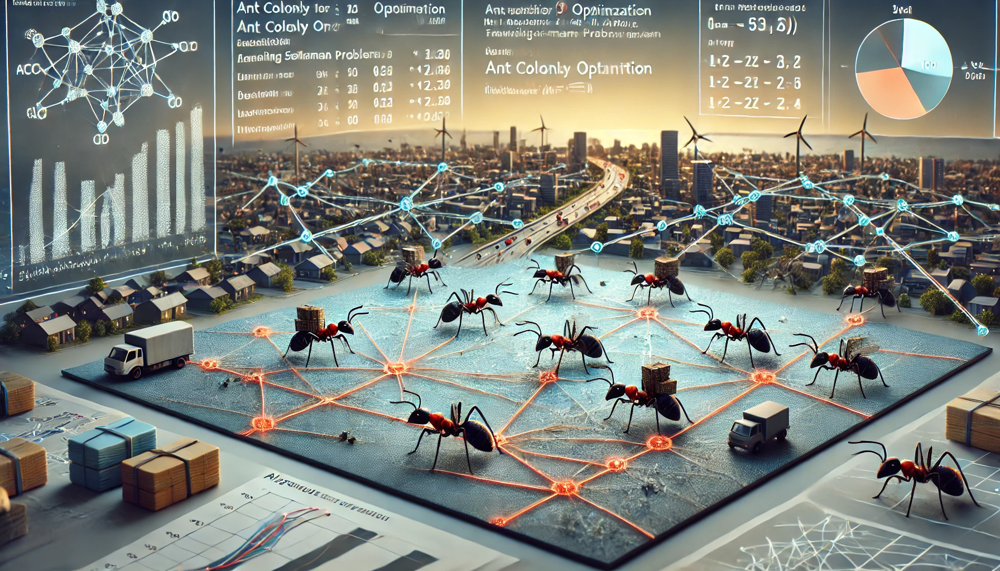

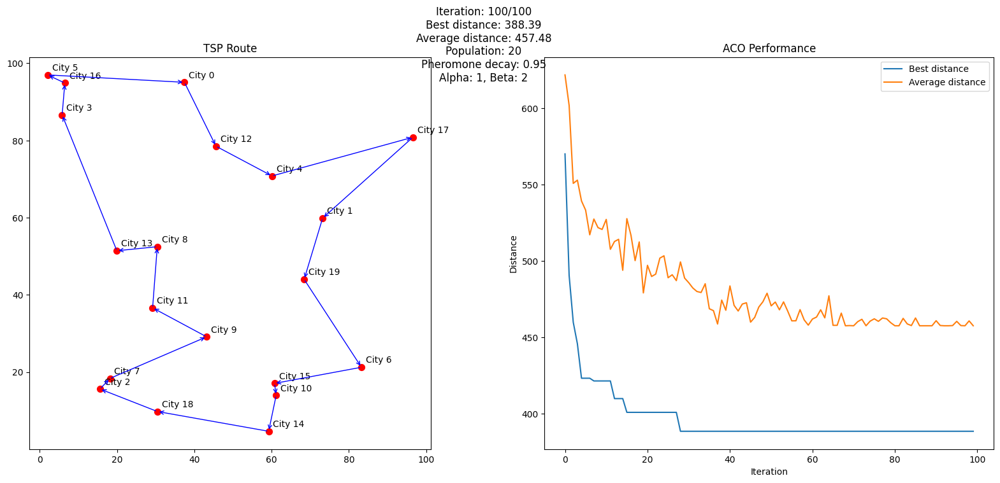

Final shortest distance: 457.48
Final path: [0, np.int64(12), np.int64(4), np.int64(1), np.int64(19), np.int64(6), np.int64(15), np.int64(10), np.int64(14), np.int64(18), np.int64(2), np.int64(7), np.int64(9), np.int64(11), np.int64(8), np.int64(13), np.int64(3), np.int64(16), np.int64(5), np.int64(17)]


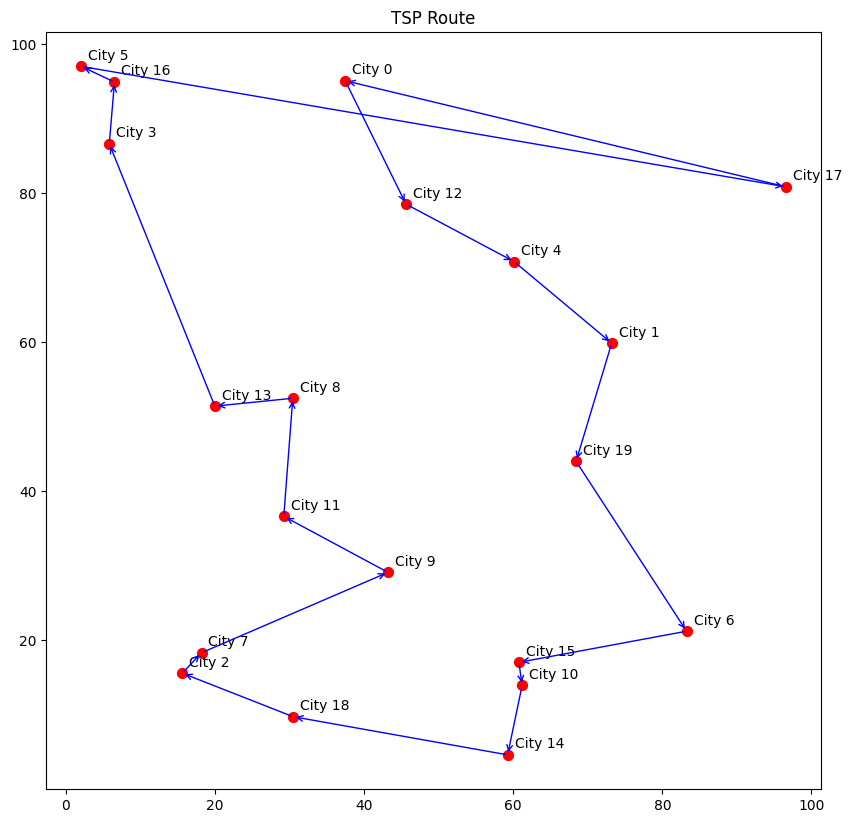

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import display, clear_output
import time

class AntColony:
    def __init__(self, distances, n_ants, n_best, n_iterations, decay, alpha=1, beta=2):
        # Initialize the Ant Colony Optimization parameters
        self.distances = distances  # Distance matrix between cities
        self.pheromone = np.ones(self.distances.shape) / len(distances)  # Initial pheromone levels
        self.all_inds = range(len(distances))  # Indices of cities
        self.n_ants = n_ants  # Number of ants
        self.n_best = n_best  # Number of best ants that deposit pheromone
        self.n_iterations = n_iterations  # Number of iterations
        self.decay = decay  # Pheromone decay rate
        self.alpha = alpha  # Pheromone importance factor
        self.beta = beta  # Distance importance factor

    def run(self):
        # Main loop for running the ACO algorithm
        shortest_path = None
        all_time_shortest_path = ("placeholder", np.inf)
        for i in range(self.n_iterations):
            # Generate all paths for current iteration
            all_paths = self.gen_all_paths()
            # Spread pheromone for the best paths
            self.spread_pheromone(all_paths, self.n_best, shortest_path=shortest_path)
            # Find the shortest path in the current iteration
            shortest_path = min(all_paths, key=lambda x: x[1])
            # Update the all-time shortest path if current is shorter
            if shortest_path[1] < all_time_shortest_path[1]:
                all_time_shortest_path = shortest_path
            yield i, shortest_path, all_time_shortest_path, self.pheromone
            # Apply pheromone decay
            self.pheromone = self.pheromone * self.decay
        
    def spread_pheromone(self, all_paths, n_best, shortest_path):
        # Spread pheromone for the best paths
        sorted_paths = sorted(all_paths, key=lambda x: x[1])
        for path, dist in sorted_paths[:n_best]:
            for move in path:
                self.pheromone[move] += 1.0 / self.distances[move]

    def gen_path_dist(self, path):
        # Calculate the total distance of a given path
        total_dist = 0
        for ele in path:
            total_dist += self.distances[ele]
        return total_dist

    def gen_all_paths(self):
        # Generate all paths for all ants
        all_paths = []
        for i in range(self.n_ants):
            path = self.gen_path(0)  # Start from city 0
            all_paths.append((path, self.gen_path_dist(path)))
        return all_paths

    def gen_path(self, start):
        # Generate a path for a single ant
        path = []
        visited = set()
        visited.add(start)
        prev = start
        for i in range(len(self.distances) - 1):
            move = self.pick_move(self.pheromone[prev], self.distances[prev], visited)
            path.append((prev, move))
            prev = move
            visited.add(move)
        path.append((prev, start))  # Return to start
        return path

    def pick_move(self, pheromone, dist, visited):
        # Pick the next move for an ant
        pheromone = np.copy(pheromone)
        pheromone[list(visited)] = 0  # Zero out the visited cities

        # Add epsilon to avoid division by zero
        dist = np.copy(dist)
        dist[dist == 0] = 1e-10

        # Calculate the probabilities of moving to each city
        row = pheromone ** self.alpha * ((1.0 / dist) ** self.beta)
        norm_row = row / row.sum()
        move = np.random.choice(self.all_inds, 1, p=norm_row)[0]
        return move

def plot_tsp(cities, path, ax):
    # Plot the Traveling Salesman Problem (TSP) path
    x = [city[0] for city in cities]
    y = [city[1] for city in cities]
    ax.clear()
    ax.scatter(x, y, c='red', s=50)
    for i, city in enumerate(cities):
        ax.annotate(f'City {i}', (city[0], city[1]), xytext=(5, 5), textcoords='offset points')
    for i in range(len(path)):
        start = cities[path[i]]
        end = cities[path[(i + 1) % len(path)]]
        ax.annotate('', xy=end, xytext=start, arrowprops=dict(arrowstyle='->', color='b', lw=1))
    ax.set_aspect('equal')
    ax.set_title('TSP Route')

def visualize_aco(cities, aco, n_iterations):
    # Visualize the Ant Colony Optimization process
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    plt.ion()

    best_distances = []
    avg_distances = []

    for i, (iteration, shortest_path, all_time_shortest_path, pheromone) in enumerate(aco.run()):
        # Plot TSP route
        path, dist = all_time_shortest_path
        plot_tsp(cities, [city[0] for city in path], ax1)

        # Plot statistics
        best_distances.append(all_time_shortest_path[1])
        avg_dist = np.mean([path[1] for path in aco.gen_all_paths()])
        avg_distances.append(avg_dist)

        ax2.clear()
        ax2.plot(range(i+1), best_distances, label='Best distance')
        ax2.plot(range(i+1), avg_distances, label='Average distance')
        ax2.set_xlabel('Iteration')
        ax2.set_ylabel('Distance')
        ax2.legend()
        ax2.set_title('ACO Performance')

        # Display additional information
        info_text = f"Iteration: {iteration + 1}/{n_iterations}\n"
        info_text += f"Best distance: {all_time_shortest_path[1]:.2f}\n"
        info_text += f"Average distance: {avg_dist:.2f}\n"
        info_text += f"Population: {aco.n_ants}\n"
        info_text += f"Pheromone decay: {aco.decay}\n"
        info_text += f"Alpha: {aco.alpha}, Beta: {aco.beta}"
        
        fig.suptitle(info_text, fontsize=12)

        display(fig)
        clear_output(wait=True)
        time.sleep(0.1)

    plt.ioff()
    plt.show()

# Example usage
np.random.seed(42)
n_cities = 20
cities = np.random.rand(n_cities, 2) * 100  # Random cities in a 100x100 space

# Calculate the distance matrix
distances = np.sqrt(((cities[:, None, :] - cities[None, :, :]) ** 2).sum(axis=-1))

# ACO parameters
n_ants = 20
n_best = 5
n_iterations = 100
decay = 0.95
alpha = 1
beta = 2

# Initialize ACO and visualize the process
aco = AntColony(distances, n_ants, n_best, n_iterations, decay, alpha, beta)
visualize_aco(cities, aco, n_iterations)

# Display final solution
final_path, final_distance = min(aco.gen_all_paths(), key=lambda x: x[1])
print(f"Final shortest distance: {final_distance:.2f}")
print("Final path:", [city[0] for city in final_path])

fig, ax = plt.subplots(figsize=(10, 10))
plot_tsp(cities, [city[0] for city in final_path], ax)
plt.show()


### How the Code Works

This code uses the Ant Colony Optimization (ACO) algorithm to solve the Traveling Salesman Problem (TSP). The goal is to find the shortest possible route that visits each city once and returns to the origin city.

### Components

1. **AntColony Class:**
   - **Initialization (`__init__`):** Initializes the ACO parameters, including the distance matrix between cities, pheromone levels, number of ants, best ants, iterations, decay rate, and importance factors (alpha and beta).
   - **Run Method (`run`):** Runs the ACO algorithm for a specified number of iterations. In each iteration, it generates all paths, spreads pheromone, and updates the shortest path found.
   - **Spread Pheromone (`spread_pheromone`):** Updates the pheromone levels based on the paths taken by the best ants.
   - **Generate Path Distance (`gen_path_dist`):** Calculates the total distance of a given path.
   - **Generate All Paths (`gen_all_paths`):** Generates paths for all ants.
   - **Generate Path (`gen_path`):** Generates a path for a single ant starting from a given city.
   - **Pick Move (`pick_move`):** Selects the next city for an ant to move to based on pheromone levels and distances.

2. **Plotting Function (`plot_tsp`):**
   - Visualizes the TSP route and cities on a 2D plot using Matplotlib. It plots the cities, annotates them, and draws arrows representing the path taken.

3. **Visualization Function (`visualize_aco`):**
   - Runs the ACO algorithm and visualizes the optimization process. It plots the TSP route, best distances, and average distances over iterations, and displays additional information about the current state of the algorithm.

### How It Works

1. **Initialization:**
   - The ACO parameters are initialized, including the distance matrix, pheromone levels, number of ants, best ants, iterations, decay rate, and importance factors.

2. **Path Generation:**
   - In each iteration, paths are generated for all ants. Each ant starts from a city and moves to the next city based on a probabilistic decision that considers pheromone levels and distances. The goal is to find paths with the shortest distances.

3. **Pheromone Update:**
   - Pheromone levels are updated based on the paths taken by the best ants. More pheromone is deposited on shorter paths, increasing the likelihood that future ants will follow these paths. Pheromone levels also decay over time to avoid convergence to a suboptimal solution.

4. **Optimization Loop:**
   - The ACO algorithm runs for a specified number of iterations. In each iteration, paths are generated, pheromone levels are updated, and the shortest path found so far is tracked. The visualization function updates the plots to show the progress of the optimization process.

5. **Visualization:**
   - The TSP route, best distances, and average distances are plotted and updated in real-time. Additional information about the current iteration, best distance, average distance, population size, pheromone decay, and importance factors is displayed.

6. **Final Solution:**
   - After completing the specified number of iterations, the final shortest path and distance are displayed. The final TSP route is plotted using Matplotlib.

### Example Usage

1. **Generate Cities:**
   - Random cities are generated in a 100x100 space.

2. **Calculate Distance Matrix:**
   - The distance matrix between cities is calculated.

3. **Initialize and Run ACO:**
   - The ACO algorithm is initialized with the generated cities and distance matrix. The `visualize_aco` function runs the algorithm and visualizes the optimization process.

4. **Display Final Solution:**
   - The final shortest distance and path are printed. The final TSP route is plotted using Matplotlib.

This code effectively demonstrates how the Ant Colony Optimization algorithm can be used to solve the Traveling Salesman Problem and visualize the optimization process in real-time.

# Artificial bee colony algorithm

### Using Artificial bee colony algorithm to solve Knapsack problem

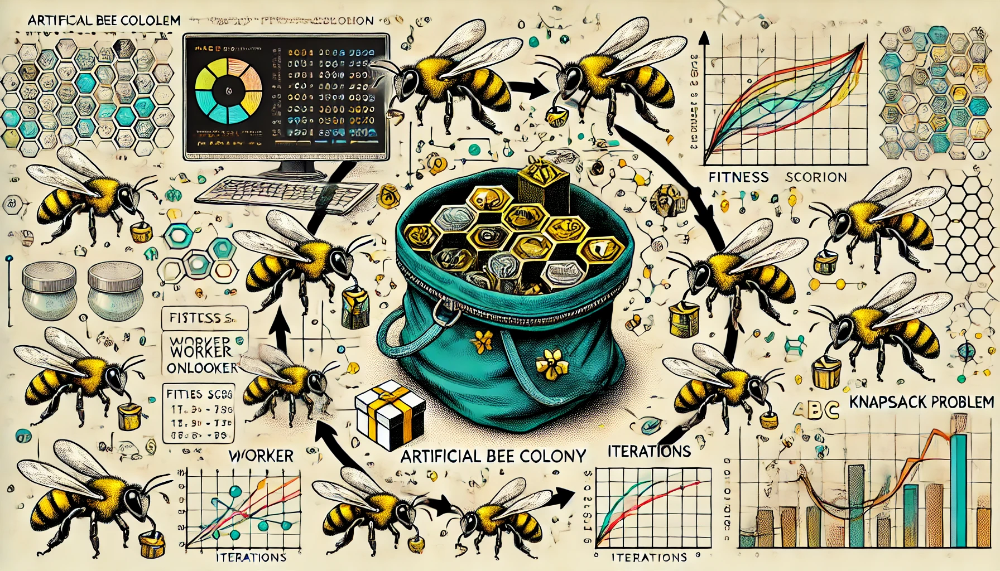

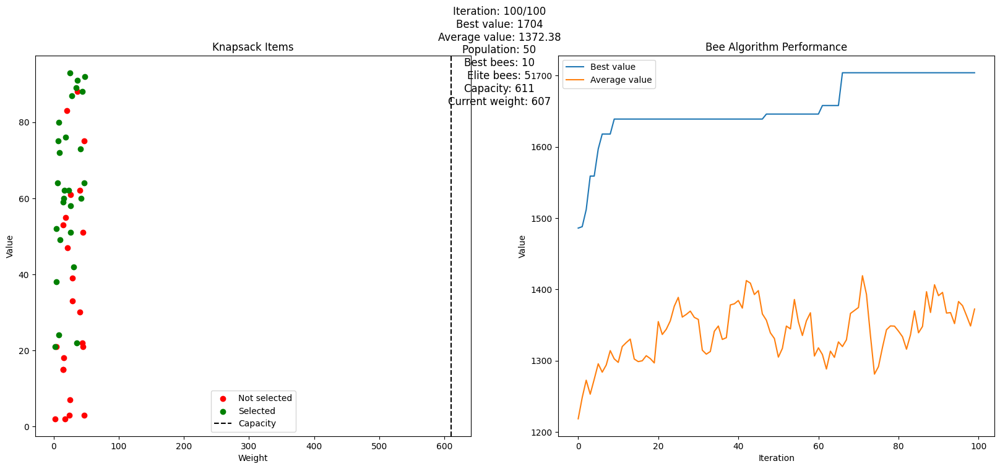

Final best value: 1704
Final solution weight: 607
Number of items selected: 27


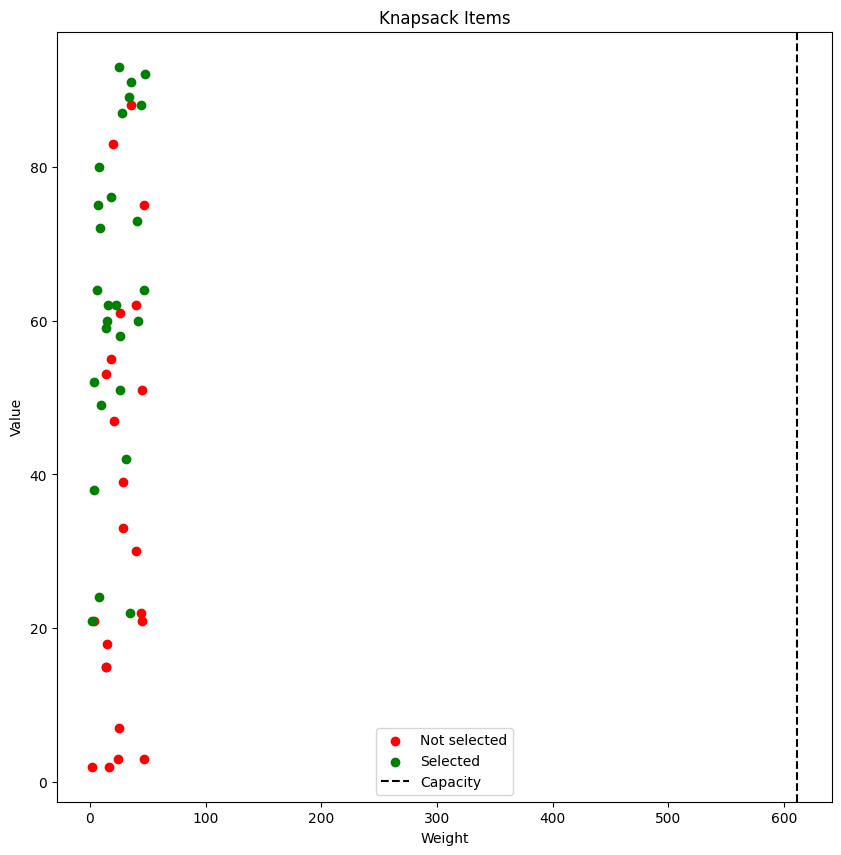

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output
import time

class BeeColony:
    def __init__(self, items, capacity, n_bees, n_best, n_elite, max_iterations):
        # Initialize the Bee Colony Optimization parameters
        self.items = items  # Items (value and weight) for the knapsack problem
        self.capacity = capacity  # Capacity of the knapsack
        self.n_bees = n_bees  # Number of bees in the colony
        self.n_best = n_best  # Number of best solutions to retain
        self.n_elite = n_elite  # Number of elite solutions to retain
        self.max_iterations = max_iterations  # Maximum number of iterations
        self.best_solution = None  # Best solution found
        self.best_value = 0  # Best value of the knapsack

    def initialize_population(self):
        # Initialize the population of solutions
        return [self.generate_random_solution() for _ in range(self.n_bees)]

    def generate_random_solution(self):
        # Generate a random valid solution for the knapsack problem
        solution = np.random.randint(2, size=len(self.items))
        while self.calculate_weight(solution) > self.capacity:
            solution[np.random.randint(len(self.items))] = 0
        return solution

    def calculate_value(self, solution):
        # Calculate the total value of the items in the solution
        return sum(solution * self.items[:, 0])

    def calculate_weight(self, solution):
        # Calculate the total weight of the items in the solution
        return sum(solution * self.items[:, 1])

    def evaluate_fitness(self, solution):
        # Evaluate the fitness of the solution
        value = self.calculate_value(solution)
        weight = self.calculate_weight(solution)
        if weight > self.capacity:
            return 0
        return value

    def mutate_solution(self, solution):
        # Mutate the solution by flipping a random bit
        new_solution = solution.copy()
        idx = np.random.randint(len(self.items))
        new_solution[idx] = 1 - new_solution[idx]
        if self.calculate_weight(new_solution) > self.capacity:
            new_solution[idx] = solution[idx]
        return new_solution

    def employed_bee_phase(self, solutions):
        # Employed bee phase: mutate solutions
        return [self.mutate_solution(solution) if np.random.random() < 0.5 else solution 
                for solution in solutions]

    def onlooker_bee_phase(self, solutions):
        # Onlooker bee phase: select solutions based on fitness
        fitness_values = np.array([self.evaluate_fitness(s) for s in solutions])
        probabilities = fitness_values / np.sum(fitness_values)
        new_solutions = []
        for _ in range(len(solutions)):
            idx = np.random.choice(len(solutions), p=probabilities)
            new_solution = self.mutate_solution(solutions[idx])
            if self.evaluate_fitness(new_solution) > self.evaluate_fitness(solutions[idx]):
                new_solutions.append(new_solution)
            else:
                new_solutions.append(solutions[idx])
        return new_solutions

    def scout_bee_phase(self, solutions):
        # Scout bee phase: replace some solutions with new random solutions
        for i in range(len(solutions)):
            if np.random.random() < 0.1:  # 10% chance of scouting
                solutions[i] = self.generate_random_solution()
        return solutions

    def run(self):
        # Run the Bee Colony Optimization algorithm
        solutions = self.initialize_population()
        for iteration in range(self.max_iterations):
            solutions = self.employed_bee_phase(solutions)
            solutions = self.onlooker_bee_phase(solutions)
            solutions = self.scout_bee_phase(solutions)
            
            solutions.sort(key=self.evaluate_fitness, reverse=True)
            best_solution = solutions[0]
            best_value = self.evaluate_fitness(best_solution)
            
            if best_value > self.best_value:
                self.best_solution = best_solution
                self.best_value = best_value
            
            yield iteration, solutions, self.best_solution, self.best_value

def plot_knapsack(items, solution, ax, capacity):
    # Plot the items in the knapsack
    ax.clear()
    values = items[:, 0]
    weights = items[:, 1]
    ax.scatter(weights[solution == 0], values[solution == 0], c='red', label='Not selected')
    ax.scatter(weights[solution == 1], values[solution == 1], c='green', label='Selected')
    ax.set_xlabel('Weight')
    ax.set_ylabel('Value')
    ax.legend()
    ax.set_title('Knapsack Items')
    ax.axvline(x=capacity, color='black', linestyle='--', label='Capacity')
    ax.legend()

def visualize_bee_algorithm(items, capacity, bee_colony):
    # Visualize the Bee Colony Optimization process
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    plt.ion()

    best_values = []
    avg_values = []

    for iteration, solutions, best_solution, best_value in bee_colony.run():
        # Plot Knapsack items
        plot_knapsack(items, best_solution, ax1, capacity)

        # Plot statistics
        best_values.append(best_value)
        avg_value = np.mean([bee_colony.evaluate_fitness(s) for s in solutions])
        avg_values.append(avg_value)

        ax2.clear()
        ax2.plot(range(iteration+1), best_values, label='Best value')
        ax2.plot(range(iteration+1), avg_values, label='Average value')
        ax2.set_xlabel('Iteration')
        ax2.set_ylabel('Value')
        ax2.legend()
        ax2.set_title('Bee Algorithm Performance')

        # Display additional information
        info_text = f"Iteration: {iteration + 1}/{bee_colony.max_iterations}\n"
        info_text += f"Best value: {best_value}\n"
        info_text += f"Average value: {avg_value:.2f}\n"
        info_text += f"Population: {bee_colony.n_bees}\n"
        info_text += f"Best bees: {bee_colony.n_best}\n"
        info_text += f"Elite bees: {bee_colony.n_elite}\n"
        info_text += f"Capacity: {capacity}\n"
        info_text += f"Current weight: {bee_colony.calculate_weight(best_solution)}"
        
        fig.suptitle(info_text, fontsize=12)

        display(fig)
        clear_output(wait=True)
        time.sleep(0.1)

    plt.ioff()
    plt.show()

# Example usage
np.random.seed(42)
n_items = 50
items = np.column_stack((
    np.random.randint(1, 100, size=n_items),  # values
    np.random.randint(1, 50, size=n_items)    # weights
))
capacity = sum(items[:, 1]) // 2  # Set capacity to half of total weight

n_bees = 50
n_best = 10
n_elite = 5
max_iterations = 100

bee_colony = BeeColony(items, capacity, n_bees, n_best, n_elite, max_iterations)
visualize_bee_algorithm(items, capacity, bee_colony)

# Display final solution
print(f"Final best value: {bee_colony.best_value}")
print(f"Final solution weight: {bee_colony.calculate_weight(bee_colony.best_solution)}")
print(f"Number of items selected: {sum(bee_colony.best_solution)}")

fig, ax = plt.subplots(figsize=(10, 10))
plot_knapsack(items, bee_colony.best_solution, ax, capacity)
plt.show()


### How the Code Works

This code uses the Bee Colony Optimization algorithm to solve the Knapsack Problem. The objective is to maximize the total value of items placed in a knapsack without exceeding its weight capacity.

### Components

1. **BeeColony Class:**
   - **Initialization (`__init__`):** Sets up the problem parameters, including the items (values and weights), knapsack capacity, number of bees, best bees, elite bees, and maximum iterations.
   - **Initialize Population (`initialize_population`):** Generates a population of random feasible solutions.
   - **Generate Random Solution (`generate_random_solution`):** Creates a random solution ensuring it does not exceed the knapsack capacity.
   - **Calculate Value (`calculate_value`):** Computes the total value of the items in a solution.
   - **Calculate Weight (`calculate_weight`):** Computes the total weight of the items in a solution.
   - **Evaluate Fitness (`evaluate_fitness`):** Evaluates the fitness of a solution based on its value, returning zero if the weight exceeds the capacity.
   - **Mutate Solution (`mutate_solution`):** Mutates a solution by flipping a random bit, ensuring it remains feasible.
   - **Employed Bee Phase (`employed_bee_phase`):** Each bee explores its solution's neighborhood by mutation.
   - **Onlooker Bee Phase (`onlooker_bee_phase`):** Bees select and exploit the best solutions based on their fitness.
   - **Scout Bee Phase (`scout_bee_phase`):** Some bees explore new random solutions to introduce diversity.
   - **Run (`run`):** Executes the bee colony optimization over the specified number of iterations, updating the best solution found.

2. **Plotting Function (`plot_knapsack`):**
   - Visualizes the knapsack items on a scatter plot, distinguishing between selected and non-selected items and indicating the knapsack capacity.

3. **Visualization Function (`visualize_bee_algorithm`):**
   - Runs the bee colony optimization and visualizes the process. It plots the items in the knapsack and the performance metrics (best and average values) over iterations.

### How It Works

1. **Initialization:**
   - The BeeColony class is initialized with the given items, knapsack capacity, and algorithm parameters (number of bees, best bees, elite bees, and maximum iterations).

2. **Population Initialization:**
   - A population of random feasible solutions is generated, ensuring that the weight of each solution does not exceed the knapsack capacity.

3. **Optimization Loop:**
   - The algorithm iterates through three main phases in each iteration:
     - **Employed Bee Phase:** Each bee explores its solution's neighborhood through mutation, potentially finding better solutions.
     - **Onlooker Bee Phase:** Bees select the best solutions based on fitness probabilities and further explore their neighborhoods.
     - **Scout Bee Phase:** Some bees are assigned to explore new random solutions to maintain diversity in the population.

4. **Solution Evaluation:**
   - Solutions are evaluated based on their total value, ensuring that the weight constraint is not violated. The best solution found is tracked and updated if a better solution is discovered.

5. **Visualization:**
   - The process is visualized in real-time, showing the items in the knapsack, the best value, and the average value over iterations. Additional information about the current state of the algorithm is displayed.

6. **Final Solution:**
   - After completing the specified number of iterations, the best solution found is displayed along with its total value and weight. The items in the final solution are visualized on a scatter plot.

### Example Usage

1. **Generate Items:**
   - Random items (values and weights) are generated for the knapsack problem.

2. **Set Capacity:**
   - The knapsack capacity is set to half of the total weight of all items.

3. **Initialize and Run Bee Colony Optimization:**
   - The BeeColony class is initialized with the generated items and parameters. The `visualize_bee_algorithm` function runs the optimization and visualizes the process.

4. **Display Final Solution:**
   - The best solution found is displayed, showing its total value, weight, and the number of selected items. The items in the final solution are visualized on a scatter plot.

This code effectively demonstrates how the Bee Colony Optimization algorithm can be used to solve the Knapsack Problem and visualize the optimization process in real-time.

# Firefly Algorithm

### Using FireFly Algorithm to solve Graph Coloring Problem

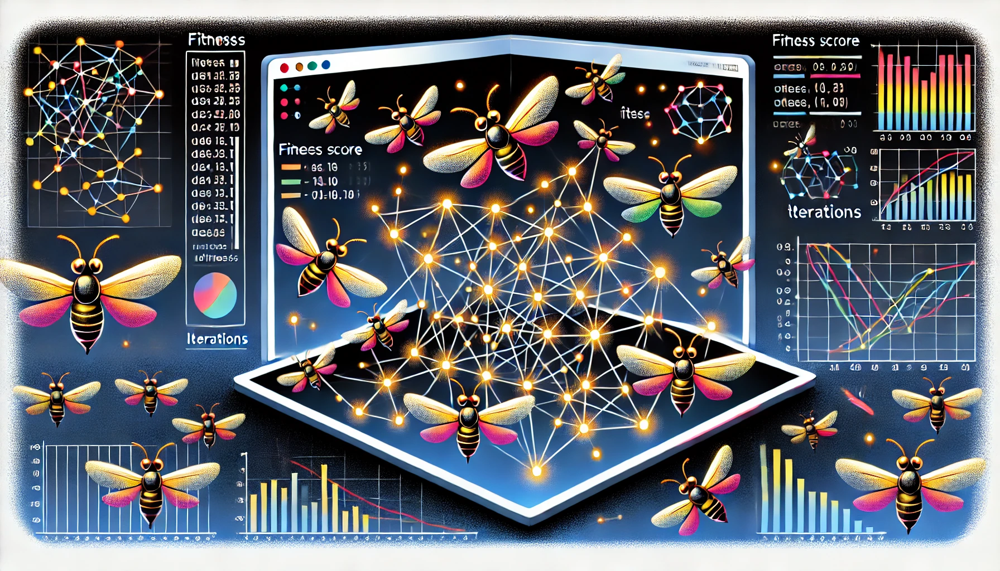

In [6]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import random

class FireflyAlgorithm:
    def __init__(self, graph, num_colors, num_fireflies, max_iterations, alpha, beta, gamma):
        # Initialize the Firefly Algorithm parameters
        self.graph = graph  # The graph to color
        self.num_colors = num_colors  # Number of colors available
        self.num_fireflies = num_fireflies  # Number of fireflies
        self.max_iterations = max_iterations  # Maximum number of iterations
        self.alpha = alpha  # Randomness parameter
        self.beta = beta  # Attraction parameter
        self.gamma = gamma  # Light absorption coefficient
        self.best_solution = None  # Best solution found
        self.best_fitness = float('inf')  # Fitness of the best solution

    def initialize_population(self):
        # Initialize the population of fireflies with random solutions
        return [self.generate_random_solution() for _ in range(self.num_fireflies)]

    def generate_random_solution(self):
        # Generate a random solution for the graph coloring problem
        return {node: random.randint(0, self.num_colors - 1) for node in self.graph.nodes()}

    def calculate_fitness(self, solution):
        # Calculate the fitness of a solution based on the number of conflicts
        conflicts = 0
        for edge in self.graph.edges():
            if solution[edge[0]] == solution[edge[1]]:
                conflicts += 1
        return conflicts

    def update_firefly(self, firefly1, firefly2):
        # Update the position of firefly1 towards firefly2
        new_firefly = {}
        for node in self.graph.nodes():
            r = abs(firefly1[node] - firefly2[node])
            beta = self.beta * np.exp(-self.gamma * r**2)
            new_color = firefly1[node] + beta * (firefly2[node] - firefly1[node]) + self.alpha * (random.random() - 0.5)
            new_firefly[node] = int(np.clip(round(new_color), 0, self.num_colors - 1))
        return new_firefly

    def run(self):
        # Run the Firefly Algorithm
        population = self.initialize_population()
        for iteration in range(self.max_iterations):
            for i in range(self.num_fireflies):
                for j in range(self.num_fireflies):
                    if self.calculate_fitness(population[j]) < self.calculate_fitness(population[i]):
                        population[i] = self.update_firefly(population[i], population[j])
            
            for firefly in population:
                fitness = self.calculate_fitness(firefly)
                if fitness < self.best_fitness:
                    self.best_fitness = fitness
                    self.best_solution = firefly.copy()
            
            yield iteration, population, self.best_solution, self.best_fitness

def create_random_graph(num_nodes, edge_probability):
    # Create a random graph
    G = nx.Graph()
    G.add_nodes_from(range(num_nodes))
    for i in range(num_nodes):
        for j in range(i+1, num_nodes):
            if random.random() < edge_probability:
                G.add_edge(i, j)
    return G

def plot_graph(graph, coloring, ax):
    # Plot the graph with the given coloring
    pos = nx.spring_layout(graph)
    colors = ['red', 'blue', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown', 'cyan', 'magenta']
    node_colors = [colors[coloring[node] % len(colors)] for node in graph.nodes()]
    nx.draw(graph, pos, node_color=node_colors, with_labels=True, ax=ax)
    ax.set_title('Graph Coloring')

def animate_firefly_algorithm(graph, firefly_alg):
    # Animate the Firefly Algorithm
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    plt.close()  # Prevent the initial empty figure from displaying

    best_fitness_values = []
    avg_fitness_values = []

    def update(frame):
        # Update the animation for each frame
        iteration, population, best_solution, best_fitness = frame
        
        ax1.clear()
        ax2.clear()

        # Plot graph coloring
        plot_graph(graph, best_solution, ax1)

        # Plot fitness progress
        best_fit


### How the Code Works

This code uses the Firefly Algorithm to solve the Graph Coloring Problem. The goal is to color the nodes of a graph such that no two adjacent nodes have the same color, minimizing the number of conflicts (edges with the same color at both ends).

### Components

1. **FireflyAlgorithm Class:**
   - **Initialization (`__init__`):** Sets up the algorithm parameters, including the graph, number of colors, number of fireflies, maximum iterations, and algorithm-specific parameters (alpha, beta, gamma).
   - **Initialize Population (`initialize_population`):** Generates a population of random coloring solutions.
   - **Generate Random Solution (`generate_random_solution`):** Creates a random coloring solution by assigning a random color to each node.
   - **Calculate Fitness (`calculate_fitness`):** Evaluates the fitness of a solution by counting the number of conflicting edges.
   - **Update Firefly (`update_firefly`):** Updates the position (coloring) of one firefly towards another based on attractiveness and randomness.
   - **Run (`run`):** Executes the Firefly Algorithm over a specified number of iterations, updating fireflies' positions and tracking the best solution.

2. **Graph Creation and Plotting Functions:**
   - **Create Random Graph (`create_random_graph`):** Generates a random graph with a specified number of nodes and edge probability.
   - **Plot Graph (`plot_graph`):** Visualizes the graph with node colors representing the coloring solution.

3. **Animation Function:**
   - **Animate Firefly Algorithm (`animate_firefly_algorithm`):** Runs the Firefly Algorithm and animates the optimization process, showing both the graph coloring and the fitness progress over iterations.

### How It Works

1. **Initialization:**
   - The `FireflyAlgorithm` class is initialized with the given graph, number of colors, number of fireflies, maximum iterations, and algorithm parameters (alpha, beta, gamma).

2. **Population Initialization:**
   - A population of random coloring solutions is generated, with each firefly representing a potential solution.

3. **Optimization Loop:**
   - The algorithm iterates through the following steps:
     - **Firefly Updates:** Each firefly moves towards brighter (better) fireflies based on their attractiveness and some randomness. The brightness is determined by the fitness, which is the number of conflicts in the coloring solution.
     - **Best Solution Tracking:** The best solution found so far is updated if a better solution (with fewer conflicts) is discovered during the iterations.

4. **Visualization:**
   - The process is visualized in real-time using Matplotlib, showing the graph with the current best coloring and plotting the fitness progress (best and average fitness) over iterations. Additional information about the current state of the algorithm is displayed.

5. **Final Solution:**
   - After completing the specified number of iterations, the best solution found is displayed, showing the final coloring and fitness (number of conflicts). The final graph coloring is visualized using Matplotlib.

### Example Usage

1. **Generate Random Graph:**
   - A random graph with a specified number of nodes and edge probability is generated using `create_random_graph`.

2. **Initialize and Run Firefly Algorithm:**
   - The `FireflyAlgorithm` class is initialized with the generated graph and parameters. The `animate_firefly_algorithm` function runs the algorithm and visualizes the process.

3. **Display Final Solution:**
   - The best solution found by the algorithm is displayed, showing the final fitness (number of conflicts) and the coloring solution. The final graph coloring is plotted using Matplotlib.

This code effectively demonstrates how the Firefly Algorithm can be used to solve the Graph Coloring Problem and visualize the optimization process in real-time.

# Intelligent Water Drops Algorithm

### using Intelligent Water Drops Algorithm to solve Vehichle Routing Problem

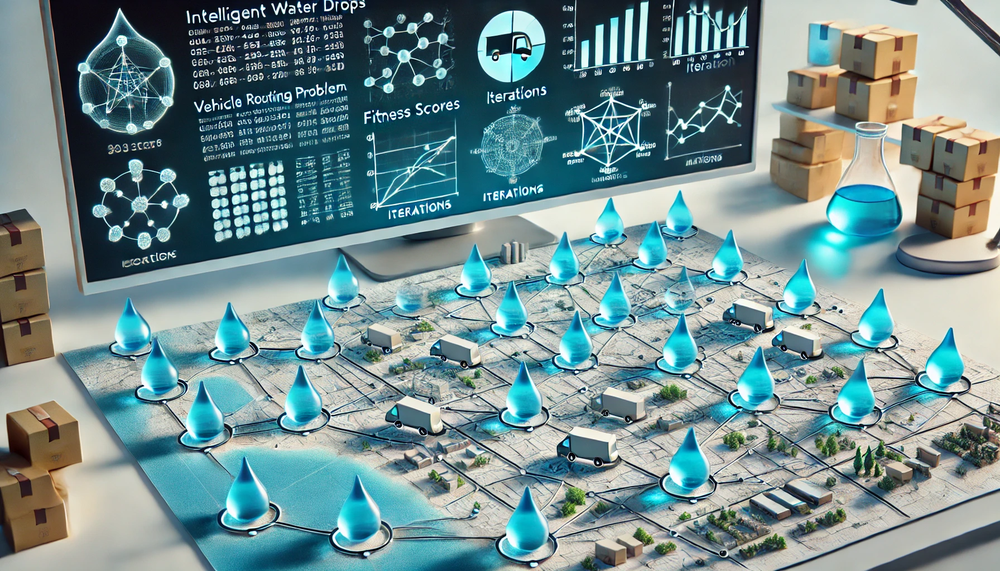

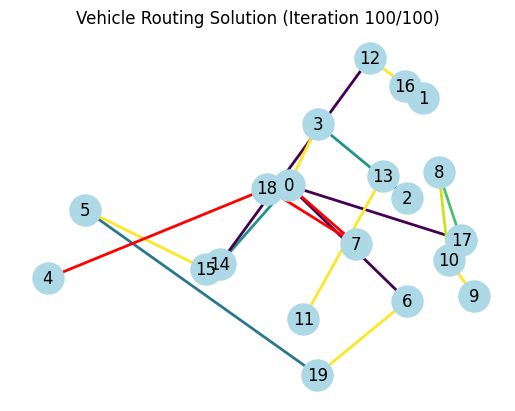

Best fitness: 600.2945858525266


In [7]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import networkx as nx
from IPython.display import HTML

class IWD:
    def __init__(self, n_cities, n_vehicles, capacity, demands, distances):
        # Initialize the IWD (Intelligent Water Drops) algorithm parameters
        self.n_cities = n_cities  # Number of cities
        self.n_vehicles = n_vehicles  # Number of vehicles
        self.capacity = capacity  # Capacity of each vehicle
        self.demands = demands  # Demands of each city
        self.distances = distances  # Distance matrix between cities

        # Soil and velocity matrices for the IWD algorithm
        self.soil = np.ones((n_cities, n_cities)) * 1000
        self.velocity = np.ones(n_cities) * 200
        self.best_solution = None  # Best solution found
        self.best_fitness = float('inf')  # Fitness of the best solution

    def run(self, n_iterations):
        # Run the IWD algorithm for a specified number of iterations
        for _ in range(n_iterations):
            solution = self.construct_solution()
            fitness = self.calculate_fitness(solution)
            
            if fitness < self.best_fitness:
                self.best_solution = solution
                self.best_fitness = fitness
            
            self.update_soil(solution)
        
        return self.best_solution, self.best_fitness

    def construct_solution(self):
        # Construct a solution for the VRP (Vehicle Routing Problem)
        solution = [[0] for _ in range(self.n_vehicles)]  # Start all routes at the depot (city 0)
        remaining_cities = set(range(1, self.n_cities))  # Cities to be visited
        
        while remaining_cities:
            for route in solution:
                if not remaining_cities:
                    break
                
                current_city = route[-1]
                next_city = self.select_next_city(current_city, remaining_cities)
                
                if next_city is not None:
                    route.append(next_city)
                    remaining_cities.remove(next_city)
        
        return solution

    def select_next_city(self, current_city, remaining_cities):
        # Select the next city to visit based on soil and velocity
        probabilities = []
        for city in remaining_cities:
            soil = self.soil[current_city][city]
            velocity = self.velocity[city]
            prob = 1 / (soil * velocity)
            probabilities.append(prob)
        
        if not probabilities:
            return None
        
        probabilities = np.array(probabilities) / sum(probabilities)
        next_city = np.random.choice(list(remaining_cities), p=probabilities)
        return next_city

    def update_soil(self, solution):
        # Update the soil levels on the paths taken in the solution
        for route in solution:
            for i in range(len(route) - 1):
                city1, city2 = route[i], route[i+1]
                self.soil[city1][city2] *= 0.9
                self.soil[city1][city2] += 0.1 / self.distances[city1][city2]

    def calculate_fitness(self, solution):
        # Calculate the total distance of the solution
        total_distance = 0
        for route in solution:
            route_distance = sum(self.distances[route[i]][route[i+1]] for i in range(len(route) - 1))
            total_distance += route_distance
        return total_distance

def generate_random_problem(n_cities, n_vehicles):
    # Generate a random VRP problem
    coordinates = np.random.rand(n_cities, 2) * 100  # Random coordinates for cities
    distances = np.sqrt(((coordinates[:, None, :] - coordinates[None, :, :]) ** 2).sum(axis=-1))  # Distance matrix
    demands = np.random.randint(1, 10, size=n_cities)  # Random demands for each city
    demands[0] = 0  # Depot (city 0) has no demand
    capacity = np.sum(demands) // n_vehicles * 2  # Capacity of each vehicle
    return coordinates, distances, demands, capacity

def visualize_solution(coordinates, solution, iteration, n_iterations):
    # Visualize the solution for the VRP
    plt.clf()
    G = nx.Graph()
    pos = {i: coord for i, coord in enumerate(coordinates)}
    G.add_nodes_from(range(len(coordinates)))
    nx.draw_networkx_nodes(G, pos, node_color='lightblue', node_size=500)
    nx.draw_networkx_labels(G, pos)
    
    colors = plt.cm.rainbow(np.linspace(0, 1, len(solution)))
    
    for route, color in zip(solution, colors):
        edges = [(route[i], route[i+1]) for i in range(len(route) - 1)]
        nx.draw_networkx_edges(G, pos, edgelist=edges, edge_color=color, width=2)
    
    plt.title(f"Vehicle Routing Solution (Iteration {iteration}/{n_iterations})")
    plt.axis('off')

# Set up the problem
n_cities = 20
n_vehicles = 5
coordinates, distances, demands, capacity = generate_random_problem(n_cities, n_vehicles)

# Run the IWD algorithm
iwd = IWD(n_cities, n_vehicles, capacity, demands, distances)
n_iterations = 100
solutions = []

for i in range(n_iterations):
    solution, fitness = iwd.run(1)
    solutions.append(solution)

# Visualization
fig, ax = plt.subplots(figsize=(10, 8))

def update(frame):
    # Update the visualization for each frame
    visualize_solution(coordinates, solutions[frame], frame + 1, n_iterations)

anim = FuncAnimation(fig, update, frames=n_iterations, interval=100, repeat=False)
plt.close()  # Prevent duplicate display in Jupyter

# Display the animation in Jupyter Notebook
HTML(anim.to_jshtml())

# Display the final solution
visualize_solution(coordinates, solutions[-1], n_iterations, n_iterations)
plt.show()

print(f"Best fitness: {iwd.best_fitness}")


### How the Code Works

This code employs the Intelligent Water Drops (IWD) algorithm to solve the Vehicle Routing Problem (VRP). The objective is to minimize the total distance traveled by a fleet of vehicles while serving all cities without exceeding vehicle capacities.

### Components

1. **IWD Class:**
   - **Initialization (`__init__`):** Sets up the problem parameters including the number of cities, vehicles, vehicle capacity, city demands, and distances between cities. Initializes the soil and velocity matrices used by the IWD algorithm.
   - **Run (`run`):** Executes the IWD algorithm for a specified number of iterations. Constructs solutions, evaluates their fitness, and updates the best solution found.
   - **Construct Solution (`construct_solution`):** Builds a solution by assigning cities to vehicles. Each vehicle starts at the depot and selects the next city to visit based on soil and velocity values.
   - **Select Next City (`select_next_city`):** Chooses the next city to visit using a probability based on soil and velocity values.
   - **Update Soil (`update_soil`):** Updates the soil levels on paths taken in the solution to reflect the quality of the route.
   - **Calculate Fitness (`calculate_fitness`):** Computes the total distance traveled in a solution, which serves as the fitness measure.

2. **Problem Generation and Visualization Functions:**
   - **Generate Random Problem (`generate_random_problem`):** Creates a random VRP instance with specified numbers of cities and vehicles, random city coordinates, demands, and vehicle capacities.
   - **Visualize Solution (`visualize_solution`):** Plots the current solution on a graph, showing the routes taken by each vehicle.

3. **Animation and Execution:**
   - **Animation Setup:** The `FuncAnimation` function from Matplotlib animates the optimization process, updating the visualization of vehicle routes in real-time.
   - **Execution:** The main script sets up the problem, runs the IWD algorithm, and visualizes the solution.

### How It Works

1. **Initialization:**
   - The IWD class is initialized with problem parameters such as the number of cities, vehicles, capacities, demands, and distances. Soil and velocity matrices are also initialized to default values.

2. **Solution Construction:**
   - In each iteration, solutions are constructed by assigning cities to vehicles. Each vehicle starts at the depot and selects the next city to visit based on a probabilistic decision influenced by soil and velocity values. This process continues until all cities are visited.

3. **Fitness Evaluation:**
   - The fitness of each solution is calculated based on the total distance traveled by all vehicles. The best solution found so far is tracked and updated if a better solution is discovered.

4. **Soil Update:**
   - Soil levels on the paths taken in the current solution are updated to reflect the quality of the routes. Better solutions result in reduced soil levels, encouraging future solutions to favor these routes.

5. **Visualization:**
   - The solution and its progress are visualized in real-time using Matplotlib. The animation shows the vehicle routes and updates the display with each iteration, providing a clear view of the optimization process.

6. **Final Solution:**
   - After completing the specified number of iterations, the best solution found is displayed. This includes the vehicle routes and the total distance traveled.

### Example Usage

1. **Generate Problem:**
   - A random VRP instance is generated with specified numbers of cities and vehicles, along with random city coordinates, demands, and vehicle capacities.

2. **Run IWD Algorithm:**
   - The IWD algorithm is run for a specified number of iterations. Solutions are constructed, evaluated, and updated iteratively.

3. **Visualization:**
   - The optimization process is visualized in real-time using Matplotlib, showing the progress of vehicle routes. The final solution is displayed with the best fitness and routes.

This code demonstrates how the Intelligent Water Drops algorithm can solve the Vehicle Routing Problem, showcasing the optimization process through real-time visualization.

# Imperialistic Competitive Algorithm

### using Imperialistic Competitive Algorithm To solve Optimizing PowerFlow(OPF) problem

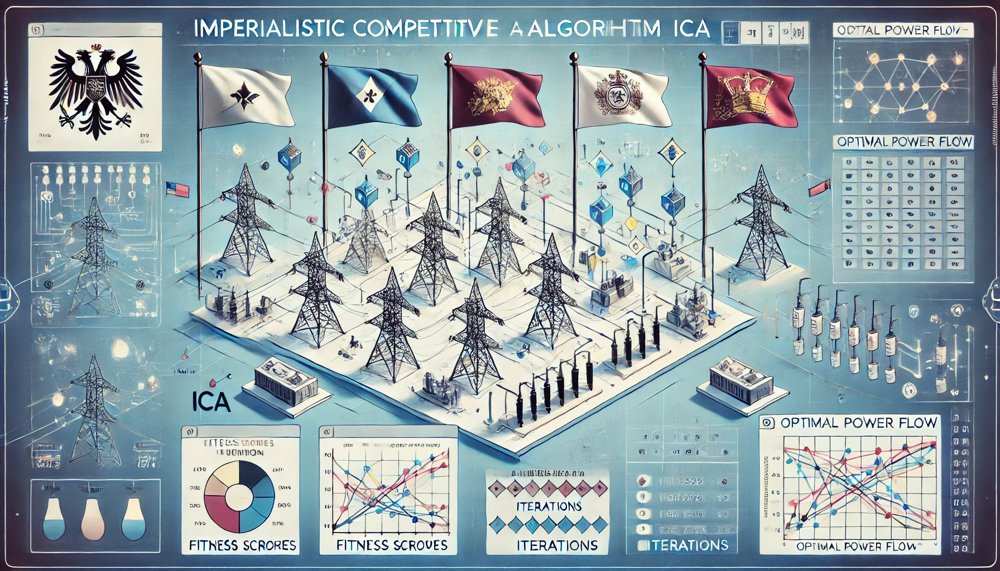

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Define the OPF (Optimal Power Flow) problem
def cost_function(solution):
    # Simplified cost function for illustration purposes
    return np.sum(solution**2)

def constraint_function(solution):
    # Generator limits (simplified for illustration)
    min_limits = np.array([10, 20, 30])
    max_limits = np.array([100, 200, 300])
    return np.all(solution >= min_limits) and np.all(solution <= max_limits)

class ImperialisticCompetitiveAlgorithm:
    def __init__(self, cost_function, constraint_function, num_countries, num_imperialists, num_iterations):
        # Initialize the ICA (Imperialistic Competitive Algorithm) parameters
        self.cost_function = cost_function  # Cost function to minimize
        self.constraint_function = constraint_function  # Constraint function
        self.num_countries = num_countries  # Number of countries (solutions)
        self.num_imperialists = num_imperialists  # Number of imperialists (best solutions)
        self.num_iterations = num_iterations  # Number of iterations to run the algorithm
        self.num_variables = 3  # Number of generators (simplified for illustration)

    def initialize(self):
        # Initialize the countries (solutions) within limits
        countries = np.random.uniform(10, 100, (self.num_countries, self.num_variables))
        costs = np.array([self.cost_function(country) for country in countries])
        sorted_indices = np.argsort(costs)
        self.imperialists = countries[sorted_indices[:self.num_imperialists]]
        self.colonies = countries[sorted_indices[self.num_imperialists:]]
        self.colonies_costs = costs[sorted_indices[self.num_imperialists:]]
        self.colony_to_empire = np.random.randint(0, self.num_imperialists, len(self.colonies))
        self.empire_costs = np.zeros(self.num_imperialists)

    def assimilate(self):
        # Assimilate colonies towards their imperialists
        for i in range(len(self.colonies)):
            empire_idx = self.colony_to_empire[i]
            direction = self.imperialists[empire_idx] - self.colonies[i]
            self.colonies[i] += np.random.rand() * direction
            # Ensure the constraints are satisfied
            if not self.constraint_function(self.colonies[i]):
                self.colonies[i] = np.clip(self.colonies[i], 10, 100)

    def compete(self):
        # Imperialistic competition to transfer colonies from weaker to stronger empires
        for _ in range(len(self.colonies)):
            weak_empire = np.argmax(self.empire_costs)
            colonies_of_weak_empire = np.where(self.colony_to_empire == weak_empire)[0]
            if len(colonies_of_weak_empire) == 0:
                continue
            colony_idx = np.random.choice(colonies_of_weak_empire)
            strong_empire = np.argmin(self.empire_costs)
            self.colony_to_empire[colony_idx] = strong_empire

    def revolution(self):
        # Revolution to create diversity by mutating some colonies
        num_revolutions = int(0.1 * len(self.colonies))  # 10% colonies undergo revolution
        revolution_indices = np.random.choice(len(self.colonies), num_revolutions, replace=False)
        self.colonies[revolution_indices] = np.random.uniform(10, 100, (num_revolutions, self.num_variables))

    def update_costs(self):
        # Update the costs of the imperialists and colonies
        for i in range(len(self.imperialists)):
            self.empire_costs[i] = self.cost_function(self.imperialists[i])
        for i in range(len(self.colonies)):
            self.colonies_costs[i] = self.cost_function(self.colonies[i])
        for i in range(len(self.imperialists)):
            empire_colonies = self.colonies[self.colony_to_empire == i]
            if len(empire_colonies) > 0:
                self.empire_costs[i] += np.mean([self.cost_function(colony) for colony in empire_colonies])

    def run(self):
        # Run the ICA algorithm for the specified number of iterations
        self.initialize()
        history = []

        for iteration in range(self.num_iterations):
            self.assimilate()
            self.revolution()
            self.update_costs()
            self.compete()
            best_cost = min(self.empire_costs)
            history.append((iteration, self.imperialists.copy(), self.colonies.copy(), best_cost))
            print(f"Iteration {iteration + 1}: Best Cost = {best_cost}")

        best_empire = np.argmin(self.empire_costs)
        return self.imperialists[best_empire], history

# Visualization function
def visualize_ica(history):
    fig, ax = plt.subplots(figsize=(10, 6))
    plt.close()

    def update(frame):
        # Update the plot for each frame
        iteration, imperialists, colonies, best_cost = history[frame]
        ax.clear()
        ax.scatter(colonies[:, 0], colonies[:, 1], c='blue', label='Colonies (Gen1 vs Gen2)')
        ax.scatter(imperialists[:, 0], imperialists[:, 1], c='red', marker='s', label='Imperialists (Gen1 vs Gen2)')
        
        ax.scatter(colonies[:, 0], colonies[:, 2], c='cyan', label='Colonies (Gen1 vs Gen3)')
        ax.scatter(imperialists[:, 0], imperialists[:, 2], c='magenta', marker='s', label='Imperialists (Gen1 vs Gen3)')
        
        ax.scatter(colonies[:, 1], colonies[:, 2], c='green', label='Colonies (Gen2 vs Gen3)')
        ax.scatter(imperialists[:, 1], imperialists[:, 2], c='yellow', marker='s', label='Imperialists (Gen2 vs Gen3)')

        ax.set_xlim(0, 110)
        ax.set_ylim(0, 110)
        ax.set_title(f'Iteration: {iteration + 1} | Best Cost: {best_cost:.2f}')
        ax.set_xlabel('Generator Outputs')
        ax.set_ylabel('Generator Outputs')
        ax.legend(loc='upper right')

    anim = FuncAnimation(fig, update, frames=len(history), repeat=False, interval=200)
    return anim

# Example usage
num_countries = 50
num_imperialists = 5
num_iterations = 100

ica = ImperialisticCompetitiveAlgorithm(cost_function, constraint_function, num_countries, num_imperialists, num_iterations)
best_solution, history = ica.run()
print(f"Best solution found: {best_solution}")

# Visualize the process
anim = visualize_ica(history)
HTML(anim.to_jshtml())


Iteration 1: Best Cost = 7317.064395963238
Iteration 2: Best Cost = 4327.214016283657
Iteration 3: Best Cost = 3086.6652303327164
Iteration 4: Best Cost = 2645.8483518194435
Iteration 5: Best Cost = 3086.6652303327164
Iteration 6: Best Cost = 2922.1648759661953
Iteration 7: Best Cost = 2539.5889607690397
Iteration 8: Best Cost = 2922.1648759661953
Iteration 9: Best Cost = 1480.5329580602715
Iteration 10: Best Cost = 2122.7413005794133
Iteration 11: Best Cost = 1480.5329580602715
Iteration 12: Best Cost = 1480.5329580602715
Iteration 13: Best Cost = 1480.5329580602715
Iteration 14: Best Cost = 1480.5329580602715
Iteration 15: Best Cost = 1480.5329580602715
Iteration 16: Best Cost = 1480.5329580602715
Iteration 17: Best Cost = 1480.5329580602715
Iteration 18: Best Cost = 1480.5329580602715
Iteration 19: Best Cost = 1480.5329580602715
Iteration 20: Best Cost = 1480.5329580602715
Iteration 21: Best Cost = 1480.5329580602715
Iteration 22: Best Cost = 1480.5329580602715
Iteration 23: Best Co

### How the Code Works

This code implements the Imperialistic Competitive Algorithm (ICA) to solve an optimization problem. In this case, the problem is a simplified Optimal Power Flow (OPF) problem with generator output constraints. The goal is to minimize the cost function while satisfying constraints.

### Components

1. **Cost and Constraint Functions:**
   - **Cost Function (`cost_function`):** Computes the cost of a solution based on the sum of the squares of generator outputs.
   - **Constraint Function (`constraint_function`):** Ensures that the generator outputs are within specified limits.

2. **ImperialisticCompetitiveAlgorithm Class:**
   - **Initialization (`__init__`):** Sets up the ICA parameters including the cost function, constraint function, number of countries (solutions), number of imperialists (best solutions), and number of iterations.
   - **Initialize Population (`initialize`):** Randomly generates initial countries (solutions) and assigns the best ones as imperialists, while the remaining become colonies.
   - **Assimilate (`assimilate`):** Moves colonies closer to their respective imperialists to improve solutions.
   - **Compete (`compete`):** Transfers colonies from weaker empires to stronger ones based on empire costs.
   - **Revolution (`revolution`):** Introduces diversity by mutating a small percentage of colonies.
   - **Update Costs (`update_costs`):** Updates the costs of imperialists and colonies and computes the overall empire costs.
   - **Run (`run`):** Executes the ICA for a specified number of iterations, performing assimilation, competition, and revolution in each iteration. The best solution is tracked and returned after completion.

3. **Visualization Function:**
   - **Visualize ICA (`visualize_ica`):** Creates an animation of the optimization process, showing the progress of colonies and imperialists over iterations.

### How It Works

1. **Initialization:**
   - The `ImperialisticCompetitiveAlgorithm` class is initialized with the given cost function, constraint function, number of countries, number of imperialists, and number of iterations. The number of variables (generators) is set to 3 for simplicity.

2. **Population Initialization:**
   - A population of countries (solutions) is randomly generated within the specified limits. The best countries are chosen as imperialists, while the rest are assigned as colonies to these imperialists.

3. **Optimization Loop:**
   - The algorithm iterates through several steps to improve the solutions:
     - **Assimilation:** Each colony moves closer to its respective imperialist to enhance the solution.
     - **Competition:** Colonies from weaker empires are transferred to stronger ones, simulating competition.
     - **Revolution:** A small percentage of colonies undergo random changes to introduce diversity and avoid local minima.
     - **Cost Update:** Costs of imperialists and colonies are recalculated, and the overall empire costs are updated.
   - The best solution found in each iteration is tracked, and the overall best solution is returned after completing the specified number of iterations.

4. **Visualization:**
   - The optimization process is visualized using Matplotlib's `FuncAnimation`, showing the movement and improvement of colonies and imperialists over iterations. The animation highlights how the solutions evolve and improve over time.

5. **Final Solution:**
   - The best solution found by the ICA is displayed along with its cost. The final state of the solution is visualized, showing the optimized generator outputs.

### Example Usage

1. **Define Problem:**
   - The cost and constraint functions are defined to represent the OPF problem with generator output constraints.

2. **Run ICA:**
   - The ICA is run for a specified number of iterations with a given number of countries and imperialists. The best solution found during the optimization process is returned and displayed.

3. **Visualize Optimization Process:**
   - The optimization process is visualized in real-time using Matplotlib, showing the progress of colonies and imperialists over iterations. The final state of the solution is also displayed.

This code effectively demonstrates how the Imperialistic Competitive Algorithm can be used to solve optimization problems, showcasing the process through real-time visualization and providing insights into the algorithm's convergence behavior.

# Multi Object Optimization Algorithm

### using Multi Object Optimization to choose a mobile phone!

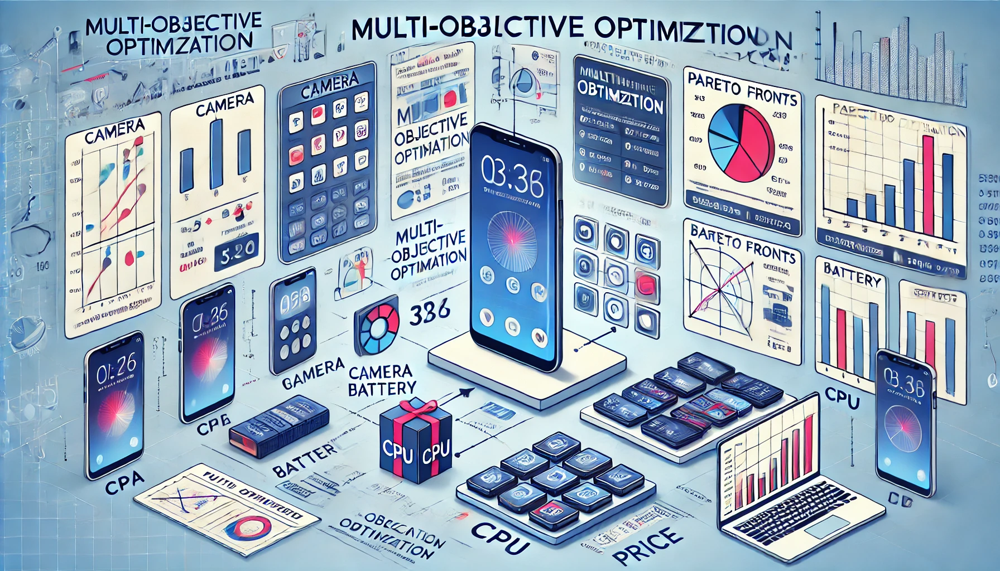

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random
from deap import base, creator, tools, algorithms
import ipywidgets as widgets
from IPython.display import display, clear_output

# Define the problem
if not hasattr(creator, "FitnessMulti"):
    creator.create("FitnessMulti", base.Fitness, weights=(-1.0, 1.0, 1.0, 1.0, -1.0))  # Price (-), Camera (+), Battery (+), CPU (+), Size (-)
if not hasattr(creator, "Individual"):
    creator.create("Individual", list, fitness=creator.FitnessMulti)

# Generate random phones
def generate_phone():
    return [
        random.uniform(200, 1500),  # Price
        random.uniform(12, 108),    # Camera (MP)
        random.uniform(2000, 5000), # Battery (mAh)
        random.uniform(1.8, 3.5),   # CPU (GHz)
        random.randint(0, 2)        # Size (0: Small, 1: Medium, 2: Large)
    ]

# Evaluation function
def evaluate(individual):
    return individual

# NSGA-II setup
toolbox = base.Toolbox()
toolbox.register("individual", tools.initIterate, creator.Individual, generate_phone)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)
toolbox.register("evaluate", evaluate)
toolbox.register("mate", tools.cxSimulatedBinaryBounded, eta=15, low=[200, 12, 2000, 1.8, 0], up=[1500, 108, 5000, 3.5, 2])
toolbox.register("mutate", tools.mutPolynomialBounded, eta=20, low=[200, 12, 2000, 1.8, 0], up=[1500, 108, 5000, 3.5, 2], indpb=0.1)
toolbox.register("select", tools.selNSGA2)

# Run the algorithm
def run_nsga2(pop_size, n_gen):
    pop = toolbox.population(n=pop_size)
    algorithms.eaSimple(pop, toolbox, cxpb=0.7, mutpb=0.2, ngen=n_gen, verbose=False)
    return pop

# Visualization function
def plot_pareto_front(population, selected_objectives):
    front = tools.sortNondominated(population, len(population), first_front_only=True)[0]
    
    fig, ax = plt.subplots(figsize=(10, 8))
    
    x_obj, y_obj = selected_objectives
    x = [ind.fitness.values[x_obj] for ind in front]
    y = [ind.fitness.values[y_obj] for ind in front]
    
    scatter = ax.scatter(x, y, c='b')
    ax.set_xlabel(objective_names[x_obj])
    ax.set_ylabel(objective_names[y_obj])
    ax.set_title("Pareto Front")
    
    # Add hover annotations
    annot = ax.annotate("", xy=(0,0), xytext=(20,20), textcoords="offset points",
                        bbox=dict(boxstyle="round", fc="w"),
                        arrowprops=dict(arrowstyle="->"))
    annot.set_visible(False)

    def update_annot(ind):
        pos = scatter.get_offsets()[ind["ind"][0]]
        annot.xy = pos
        text = "\n".join([f"{name}: {front[ind['ind'][0]][i]:.2f}" 
                          for i, name in enumerate(objective_names)])
        annot.set_text(text)

    def hover(event):
        vis = annot.get_visible()
        if event.inaxes == ax:
            cont, ind = scatter.contains(event)
            if cont:
                update_annot(ind)
                annot.set_visible(True)
                fig.canvas.draw_idle()
            else:
                if vis:
                    annot.set_visible(False)
                    fig.canvas.draw_idle()

    fig.canvas.mpl_connect("motion_notify_event", hover)
    
    plt.show()

# Interactive widgets
pop_size_slider = widgets.IntSlider(value=100, min=50, max=500, step=50, description='Population Size:')
n_gen_slider = widgets.IntSlider(value=50, min=10, max=200, step=10, description='Generations:')
objective_names = ['Price', 'Camera', 'Battery', 'CPU', 'Size']
x_obj_dropdown = widgets.Dropdown(options=objective_names, value='Price', description='X Objective:')
y_obj_dropdown = widgets.Dropdown(options=objective_names, value='Camera', description='Y Objective:')
run_button = widgets.Button(description='Run Optimization', button_style='success')
output = widgets.Output()

def on_button_clicked(b):
    with output:
        clear_output(wait=True)
        print("Running optimization...")
        x_obj_index = objective_names.index(x_obj_dropdown.value)
        y_obj_index = objective_names.index(y_obj_dropdown.value)
        population = run_nsga2(pop_size_slider.value, n_gen_slider.value)
        plot_pareto_front(population, (x_obj_index, y_obj_index))

run_button.on_click(on_button_clicked)

# Display widgets
display(widgets.VBox([pop_size_slider, n_gen_slider, x_obj_dropdown, y_obj_dropdown, run_button, output]))


In [67]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from IPython.display import display, clear_output

# Define the urban planning problem
class UrbanPlan:
    def __init__(self):
        self.green_space = np.random.uniform(10, 40)  # percentage
        self.housing_density = np.random.uniform(50, 200)  # units per hectare
        self.infrastructure_cost = np.random.uniform(1e6, 5e6)  # dollars
        self.walkability = np.random.uniform(40, 90)  # score out of 100
        self.energy_efficiency = np.random.uniform(50, 95)  # percentage

    def objectives(self):
        return [
            self.green_space,
            self.housing_density,
            -self.infrastructure_cost,  # We want to minimize cost
            self.walkability,
            self.energy_efficiency
        ]

# NSGA-II inspired algorithm
def dominates(a, b):
    return all(a_val >= b_val for a_val, b_val in zip(a, b)) and any(a_val > b_val for a_val, b_val in zip(a, b))

def non_dominated_sort(population):
    front = []
    for i, individual in enumerate(population):
        individual.domination_count = 0
        individual.dominated_solutions = set()
        for other in population[i+1:]:
            if dominates(individual.objectives(), other.objectives()):
                individual.dominated_solutions.add(other)
            elif dominates(other.objectives(), individual.objectives()):
                individual.domination_count += 1
        if individual.domination_count == 0:
            front.append(individual)
    return front

def crossover(parent1, parent2):
    child = UrbanPlan()
    for attr in vars(child):
        if np.random.random() < 0.5:
            setattr(child, attr, getattr(parent1, attr))
        else:
            setattr(child, attr, getattr(parent2, attr))
    return child

def mutate(individual, mutation_rate):
    for attr in vars(individual):
        if np.random.random() < mutation_rate:
            current_value = getattr(individual, attr)
            setattr(individual, attr, current_value * np.random.uniform(0.8, 1.2))
    return individual

# Optimization function
def optimize(pop_size, generations, mutation_rate):
    population = [UrbanPlan() for _ in range(pop_size)]
    
    for _ in range(generations):
        front = non_dominated_sort(population)
        new_population = front.copy()
        
        while len(new_population) < pop_size:
            parent1, parent2 = np.random.choice(front, 2, replace=False)
            child = crossover(parent1, parent2)
            child = mutate(child, mutation_rate)
            new_population.append(child)
        
        population = new_population[:pop_size]
    
    return non_dominated_sort(population)

# Plotting function
def plot_pareto_front(pareto_front, x_obj, y_obj):
    obj_names = ['Green Space (%)', 'Housing Density (units/ha)', 'Infrastructure Cost ($)', 'Walkability Score', 'Energy Efficiency (%)']
    x = [solution.objectives()[x_obj] for solution in pareto_front]
    y = [solution.objectives()[y_obj] for solution in pareto_front]
    
    plt.figure(figsize=(10, 6))
    plt.scatter(x, y)
    plt.xlabel(obj_names[x_obj])
    plt.ylabel(obj_names[y_obj])
    plt.title('Pareto Front')
    if x_obj == 2:  # Infrastructure cost
        plt.xlabel(obj_names[x_obj] + ' (Minimizing)')
        plt.xscale('symlog')
    if y_obj == 2:  # Infrastructure cost
        plt.ylabel(obj_names[y_obj] + ' (Minimizing)')
        plt.yscale('symlog')
    plt.grid(True)
    plt.show()

# Interactive optimization and visualization
@interact_manual(
    pop_size=widgets.IntSlider(min=10, max=500, step=10, value=100, description='Population Size:'),
    generations=widgets.IntSlider(min=10, max=200, step=10, value=50, description='Generations:'),
    mutation_rate=widgets.FloatSlider(min=0.01, max=0.5, step=0.01, value=0.1, description='Mutation Rate:'),
    x_objective=widgets.Dropdown(options=[(name, i) for i, name in enumerate(['Green Space', 'Housing Density', 'Infrastructure Cost', 'Walkability', 'Energy Efficiency'])], description='X Objective:'),
    y_objective=widgets.Dropdown(options=[(name, i) for i, name in enumerate(['Green Space', 'Housing Density', 'Infrastructure Cost', 'Walkability', 'Energy Efficiency'])], description='Y Objective:')
)
def run_optimization(pop_size, generations, mutation_rate, x_objective, y_objective):
    clear_output(wait=True)
    print(f"Running optimization with population size {pop_size}, {generations} generations, and mutation rate {mutation_rate}")
    pareto_front = optimize(pop_size, generations, mutation_rate)
    plot_pareto_front(pareto_front, x_objective, y_objective)
    print(f"Optimization complete. Pareto front size: {len(pareto_front)}")

# Display instructions
print("Adjust the parameters and click 'Run Optimization' to see the results.")
print("The graph will show the Pareto front for the selected objectives.")
print("Note: Infrastructure Cost is being minimized, while other objectives are being maximized.")

interactive(children=(IntSlider(value=100, description='Population Size:', max=500, min=10, step=10), IntSlide…

Adjust the parameters and click 'Run Optimization' to see the results.
The graph will show the Pareto front for the selected objectives.
Note: Infrastructure Cost is being minimized, while other objectives are being maximized.
